In [2]:
import geopandas as gpd
import pandas as pd
import folium
import matplotlib.pyplot as plt

In [3]:
DATA_DIR = 'data'

def read_csv(path, sep=','):
    return pd.read_csv(path, sep=sep)

def read_shp(path):
    return gpd.read_file(path)

In [4]:
# read in data
data = read_csv(f'{DATA_DIR}/seutukunta_tyollisyys_2013.csv')

In [5]:
data.head()

,seutukunta,seutukunta_nimi,tyollisyys
0,SK011,Helsingin seutukunta,73.0
1,SK014,Raaseporin seutukunta,70.3
2,SK015,Porvoon seutukunta,74.3
3,SK016,Loviisan seutukunta,71.5
4,SK021,Åboland-Turunmaan seutukunta,72.9


In [6]:
# A layer saved to GeoJson in QGIS..
#geodata = gpd.read_file('Seutukunnat_2018.geojson')

# Get features directly from the wfs
url = "http://geo.stat.fi/geoserver/tilastointialueet/wfs?request=GetFeature&typename=tilastointialueet:seutukunta1000k_2020&outputformat=JSON"
geodata = gpd.read_file(url)

In [7]:
geodata.head()

,id,seutukunta,vuosi,nimi,namn,name,geometry
0,seutukunta1000k_2020.1,011,2020,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969..."
1,seutukunta1000k_2020.2,014,2020,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668..."
2,seutukunta1000k_2020.3,015,2020,Porvoo,Borgå,Porvoo,"MULTIPOLYGON (((427108.141 6694151.025, 427175..."
3,seutukunta1000k_2020.4,016,2020,Loviisa,Lovisa,Loviisa,"MULTIPOLYGON (((444038.768 6703649.355, 444155..."
4,seutukunta1000k_2020.5,021,2020,Åboland-Turunmaa,Åboland-Turunmaa,Åboland-Turunmaa,"MULTIPOLYGON (((190999.717 6715878.622, 191021..."


In [8]:
# remove substrings from strings. using a lambda function makes this incredibly easy to do
# give a function that can be applied to every column in the series and you are good to go
data['seutukunta'] = data['seutukunta'].apply(lambda x: x[2:])
data['seutukunta'].head()

0    011
1    014
2    015
3    016
4    021
Name: seutukunta, dtype: object

In [9]:
# merge data on the 'seutukunta' column
geodata = geodata.merge(data, on='seutukunta')
geodata.head()

,id,seutukunta,vuosi,nimi,namn,name,geometry,seutukunta_nimi,tyollisyys
0,seutukunta1000k_2020.1,011,2020,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969...",Helsingin seutukunta,73.0
1,seutukunta1000k_2020.2,014,2020,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668...",Raaseporin seutukunta,70.3
2,seutukunta1000k_2020.3,015,2020,Porvoo,Borgå,Porvoo,"MULTIPOLYGON (((427108.141 6694151.025, 427175...",Porvoon seutukunta,74.3
3,seutukunta1000k_2020.4,016,2020,Loviisa,Lovisa,Loviisa,"MULTIPOLYGON (((444038.768 6703649.355, 444155...",Loviisan seutukunta,71.5
4,seutukunta1000k_2020.5,021,2020,Åboland-Turunmaa,Åboland-Turunmaa,Åboland-Turunmaa,"MULTIPOLYGON (((190999.717 6715878.622, 191021...",Åboland-Turunmaan seutukunta,72.9


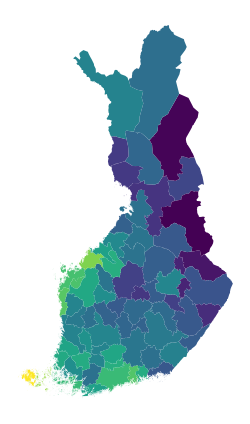

In [10]:
fig, ax = plt.subplots(figsize=(8, 6))
geodata.plot(ax=ax, column='tyollisyys')
ax.axis('off')
plt.tight_layout()

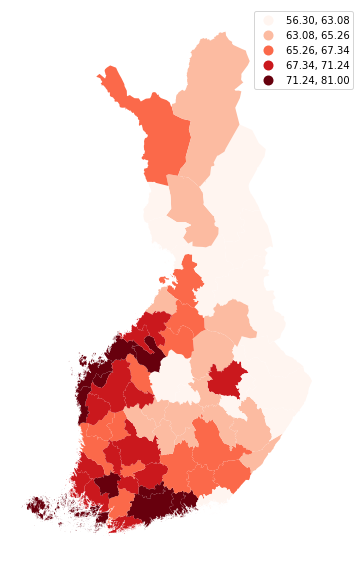

In [13]:
fig, ax = plt.subplots(figsize=(10, 8))
geodata.plot(ax=ax, scheme='quantiles', cmap='Reds', legend=True, column='tyollisyys')
ax.get_legend().set_bbox_to_anchor((1.1, 1))
ax.axis('off')
plt.tight_layout()

- #### creating an interactive map with folium

In [14]:
# create geo-id to be used by folium
geodata['geoid'] = geodata.index.astype(str)

In [15]:
# Create a Map instance
m = folium.Map(location=[60.25, 24.8], tiles = 'cartodbpositron', zoom_start=8, control_scale=True)

folium.Choropleth(geo_data = geodata, 
                  data = geodata, 
                  columns=['geoid','tyollisyys'], 
                  key_on='feature.id', 
                  fill_color='RdYlBu', 
                  line_color='white',
                  line_weight=0,
                  legend_name= 'Employment rate in Finland').add_to(m)
m

- #### add tooltips to show values for each sector

In [16]:
folium.features.GeoJson(geodata, name='Labels',
               style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                tooltip=folium.features.GeoJsonTooltip(fields=['tyollisyys'],
                                              aliases = ['Employment rate'],
                                              labels=True,
                                              sticky=False
                                             )
                       ).add_to(m)

m

- #### create a custom classification function scheme

In [17]:
import branca

# create a series out variable to map
employed_series = data.set_index('seutukunta')['tyollisyys']

# set colorscale
colorscale = branca.colormap.linear.RdYlBu_05.to_step(data=geodata['tyollisyys'], n=6, method='quantiles')

def custom_scheme(feature):
    employed = employed_series.get(int(feature['id']), None)
    return {
        'fillOpacity': 0.5,
        'weight': 0,
        'fillColor': '#black' if employed is None else colorscale(employed)
    }

In [19]:
# Based on :
#https://python-visualization.github.io/folium/quickstart.html
#https://github.com/python-visualization/folium/blob/master/examples/Colormaps.ipynb


# Create a Map instance
m = folium.Map(location=[60.25, 24.8], tiles = 'cartodbpositron', zoom_start=6, control_scale=True)

# add geojson layer on the map, which visualizes the polygons based on your style function, and additional parameters  
folium.GeoJson(
   geodata,
   name = "Employment rate in Finland (2013)",
   style_function=custom_scheme,
   tooltip=folium.features.GeoJsonTooltip(fields=['nimi','tyollisyys'],
                                             aliases = ['Region','Employment rate (%)'],
                                             labels=True,
                                             sticky=True)
).add_to(m)


#Add a legend
colorscale .caption = 'Employment rate (%)'
m.add_child(colorscale)

# Create a layer control object and add it to our map instance
folium.LayerControl().add_to(m)

#Show map
m

In [20]:
m.save('employment_rate_in_finland.html')